## Near-optimal foragers

In [5]:
%load_ext autoreload
%autoreload 2
from utils.run_foraging_testbed import para_scan
from utils.foraging_testbed_models import Bandit
from utils.foraging_testbed_plots import plot_all_reps, plot_para_scan, plot_model_compet
from utils.plot_mice import analyze_runlength_Lau2005, plot_runlength_Lau2005
import seaborn as sns
sns.set()

import numpy as np
from utils.run_foraging_testbed import *
%matplotlib notebook

# Try to open parallel pools (needs multiprocessing package)
try:
    n_worker = int(mp.cpu_count()/2)  # Optimal number = number of physical cores
    pool = mp.Pool(processes = n_worker)
except:
    pool = ''
    
# Parameter settings
n_trials = 1000
n_repetitions = 500

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


### Enfoced {m,1} Pattern

#### Block-state enables fast switch

apply_async: 100%|██████████| 12000/12000 [01:45<00:00, 114.04it/s]


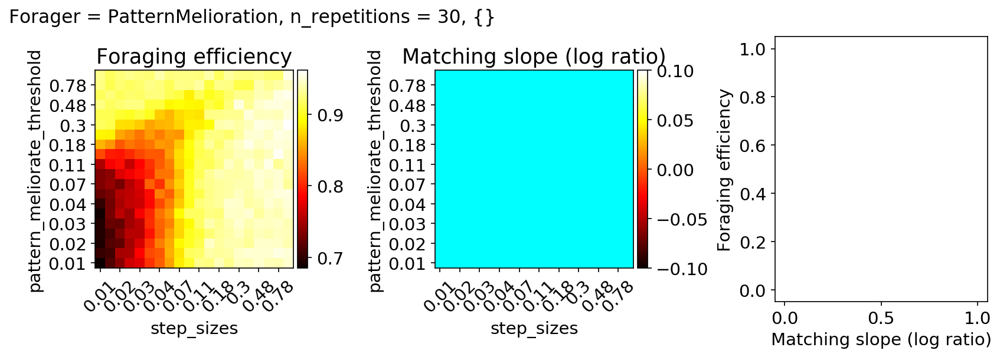

In [15]:
para_to_scan = {'step_sizes': np.power(10, np.linspace(-2,0,20)),
                'pattern_meliorate_threshold': np.power(10, np.linspace(-2,0,20)),
                }
results_para_scan = para_scan('PatternMelioration', para_to_scan, n_reps = 30, pool = pool)


apply_async: 100%|██████████| 50/50 [00:00<00:00, 101.90it/s]


<IPython.core.display.Javascript object>


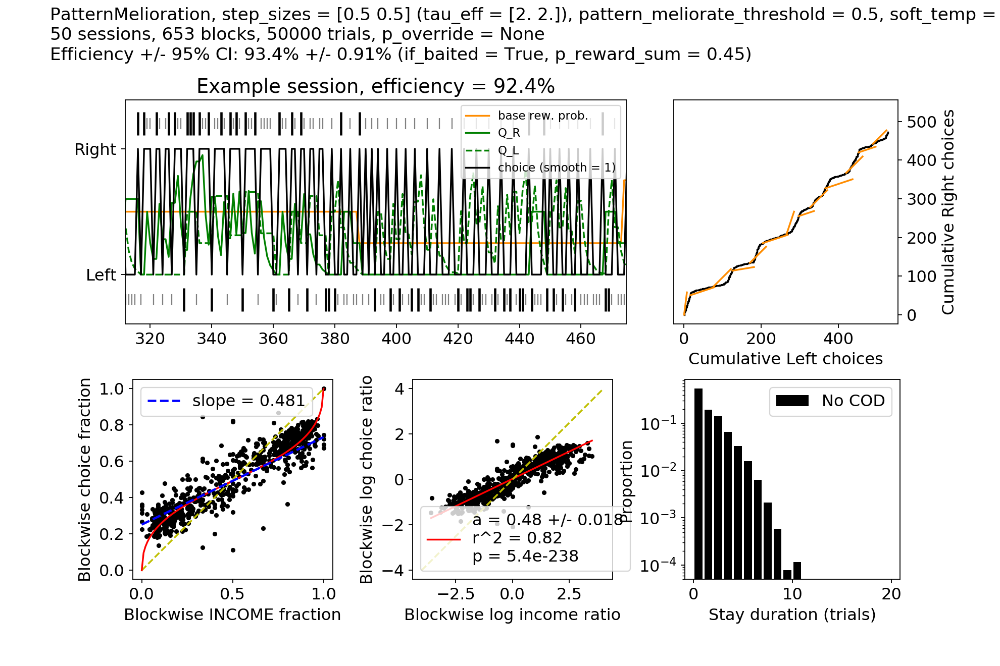

<IPython.core.display.Javascript object>


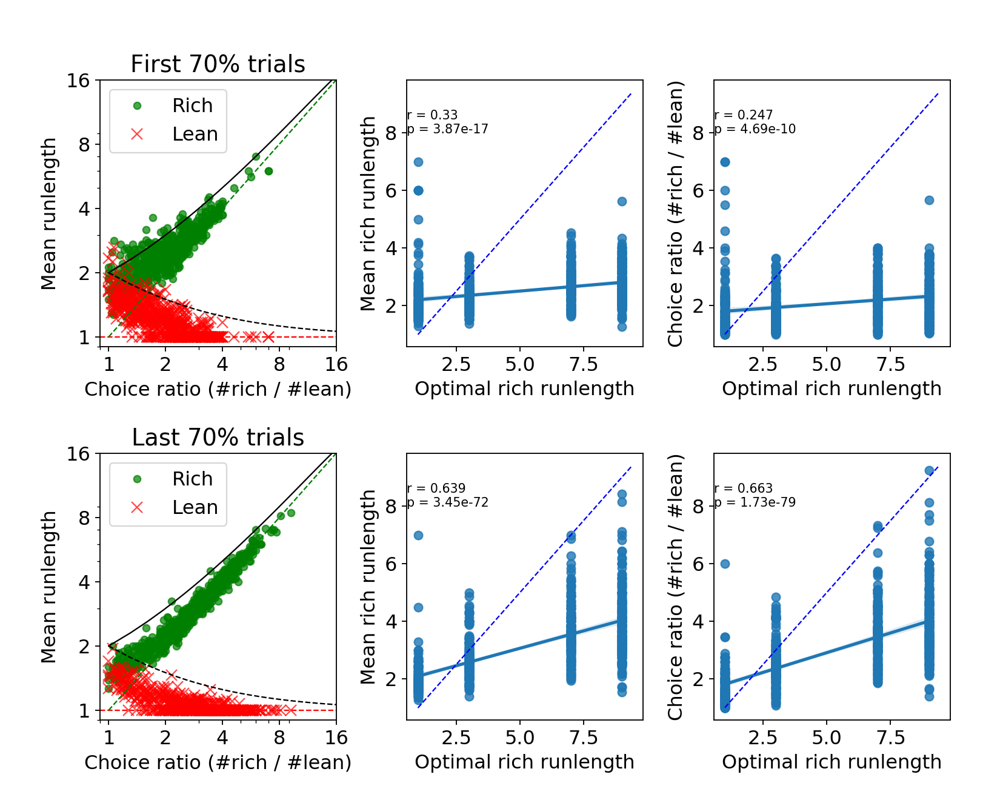

In [9]:
bandit = Bandit(forager = 'PatternMelioration', step_sizes = 0.5, pattern_meliorate_threshold = 0.5, 
                block_size_mean = 80, n_trials = 1000)
results_all_sessions = run_sessions_parallel(bandit, n_reps = 50, pool = pool)

# === Runlength analysis ===
choice_history = results_all_sessions['choice_history']
p_reward = results_all_sessions['p_reward']

run_length_Lau = analyze_runlength_Lau2005(choice_history, p_reward, block_partitions = [70,70])
plot_runlength_Lau2005(run_length_Lau, [70,70]);

#### Softmax -> get p -> use {floor(p/(1-p)), 1}

apply_async: 100%|██████████| 50/50 [00:00<00:00, 93.19it/s]


<IPython.core.display.Javascript object>


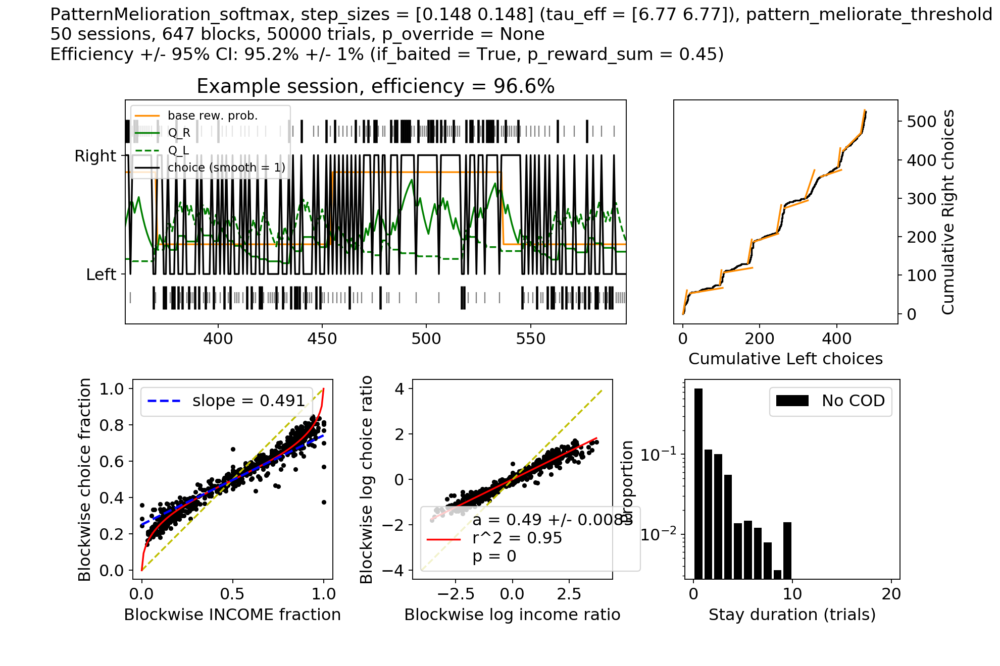

<IPython.core.display.Javascript object>


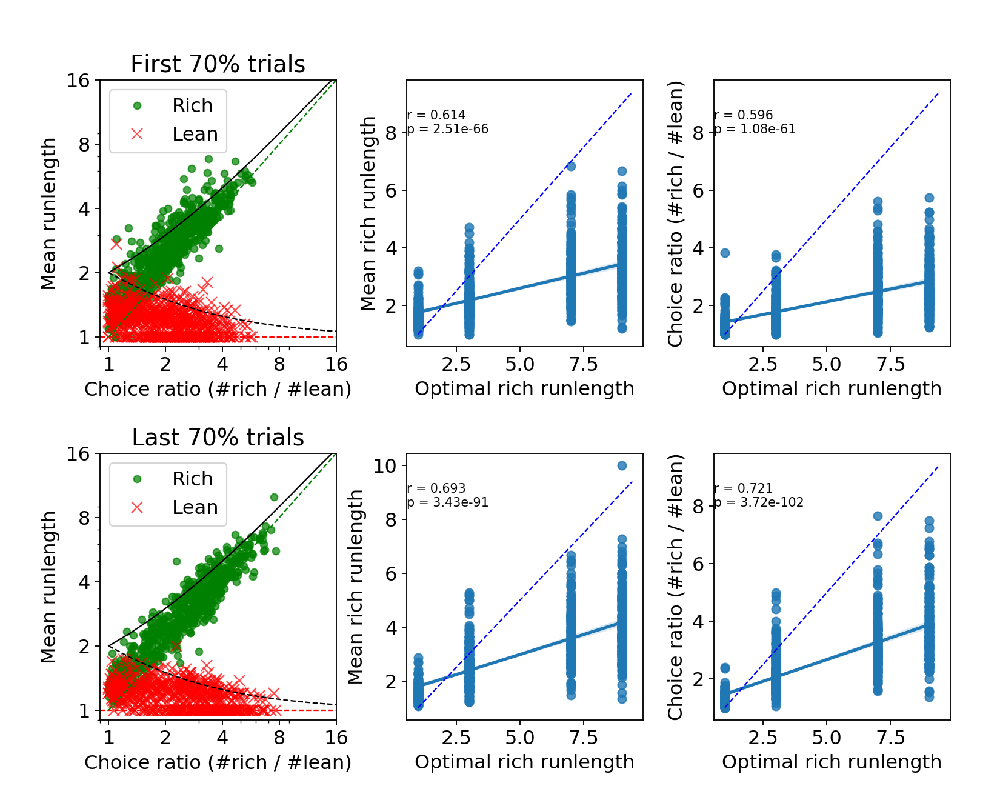

In [7]:
bandit = Bandit(forager = 'PatternMelioration_softmax', step_sizes = 0.1477, pattern_meliorate_softmax_temp = 0.1781, 
                    # pattern_meliorate_softmax_max_step = 4.6,
                    block_size_mean = 80, n_trials = global_n_trials)
results_all_sessions = run_sessions_parallel(bandit, n_reps = 50, pool = pool)

# === Runlength analysis ===
choice_history = results_all_sessions['choice_history']
p_reward = results_all_sessions['p_reward']

run_length_Lau = analyze_runlength_Lau2005(choice_history, p_reward, block_partitions = [70,70])
plot_runlength_Lau2005(run_length_Lau, [70,70]);


### Full state Q-learning


#### Without blocks (for demo)

apply_async: 100%|██████████| 500/500 [00:05<00:00, 85.57it/s]


<IPython.core.display.Javascript object>


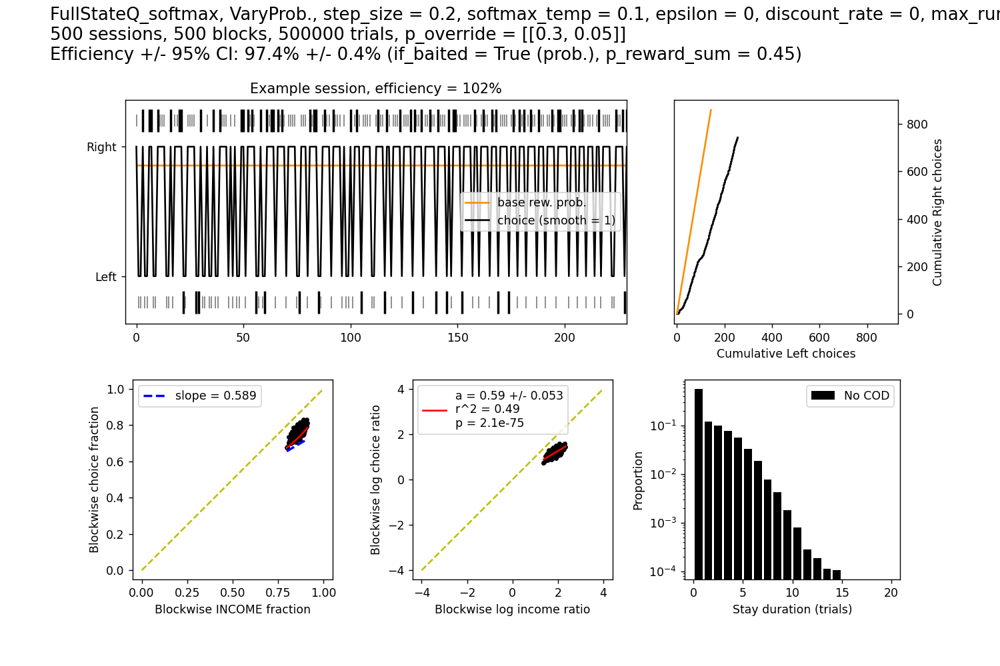

In [8]:
bandit = Bandit(forager = 'FullStateQ_softmax', block_size_mean = 2000, n_trials = 1000, if_baited = True, p_reward_pairs = [[0.3, 0.05]], 
                    step_sizes = 0.2, discount_rate = 0, max_run_length = 15, softmax_temperature = 0.1, 
                    if_plot_Q = False, if_varying_amplitude = False)
results_all_sessions = run_sessions_parallel(bandit, n_reps = 500, pool = pool)

#### With blocks

apply_async: 100%|██████████| 50/50 [00:00<00:00, 61.63it/s]


<IPython.core.display.Javascript object>


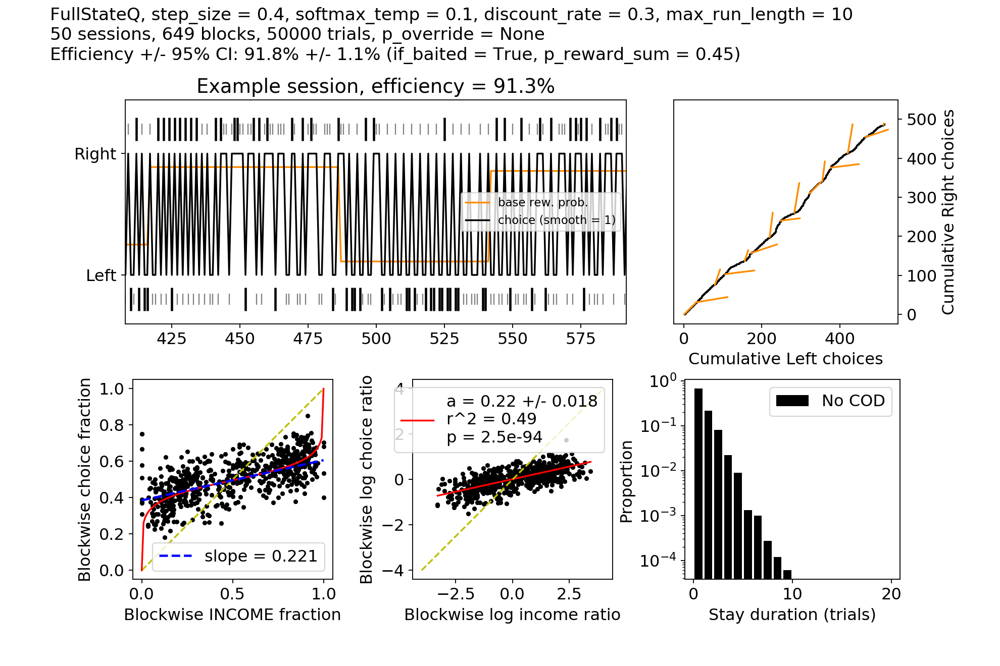

<IPython.core.display.Javascript object>


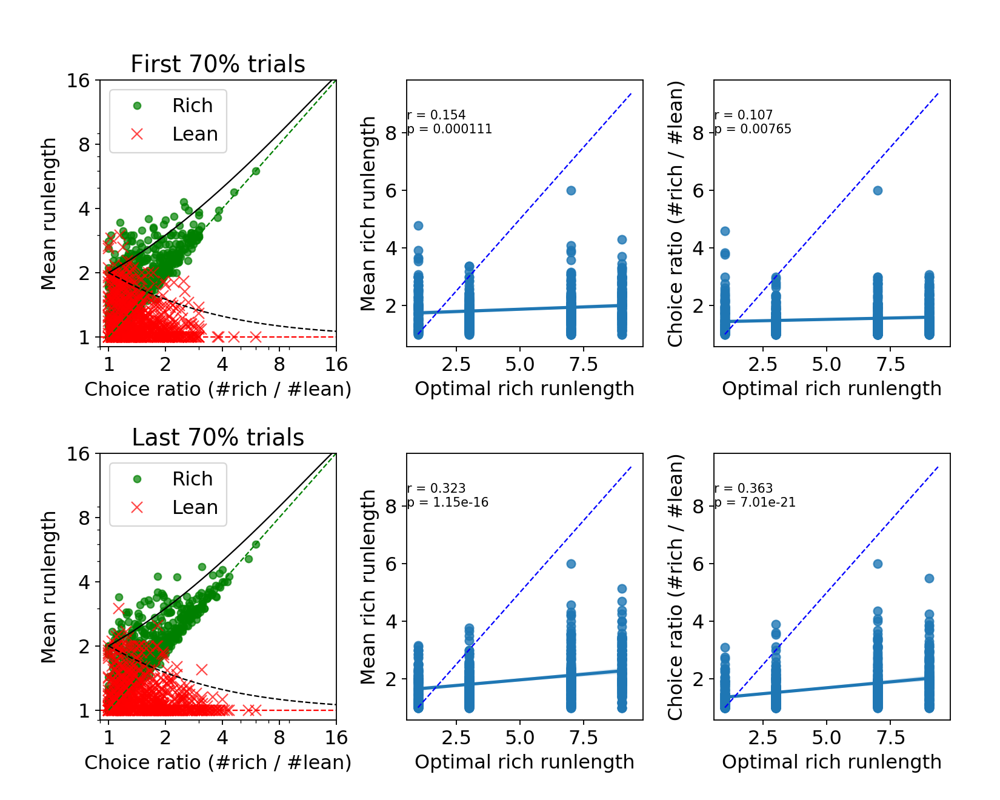

In [11]:
bandit = Bandit(forager = 'FullStateQ_softmax', block_size_mean = 80, n_trials = 1000,
                step_sizes = 0.4, softmax_temperature = 0.1, discount_rate = 0.3, max_run_length = 10)
results_all_sessions = run_sessions_parallel(bandit, n_reps = 50, pool = pool)

# === Runlength analysis ===
choice_history = results_all_sessions['choice_history']
p_reward = results_all_sessions['p_reward']

run_length_Lau = analyze_runlength_Lau2005(choice_history, p_reward, block_partitions = [70,70])
plot_runlength_Lau2005(run_length_Lau, [70,70]);

apply_async: 100%|██████████| 11250/11250 [02:46<00:00, 67.38it/s]


<IPython.core.display.Javascript object>


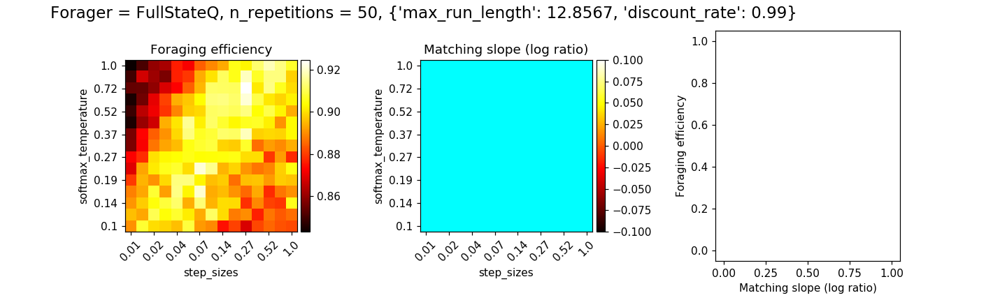

In [3]:
para_to_scan = {'step_sizes': np.power(10, np.linspace(-2,0,15)),
                'softmax_temperature': np.power(10, np.linspace(-1,0,15)),
                }
results_para_scan = para_scan('FullStateQ_softmax', para_to_scan, n_reps = 50, 
                              max_run_length = 12.8567, discount_rate = 0.99, # softmax_temperature = 0.1,
                              pool = pool)


## Varying Amplitude Baiting

### Enfoced {m,1} Pattern

apply_async: 100%|██████████| 50/50 [00:00<00:00, 95.22it/s]


<IPython.core.display.Javascript object>


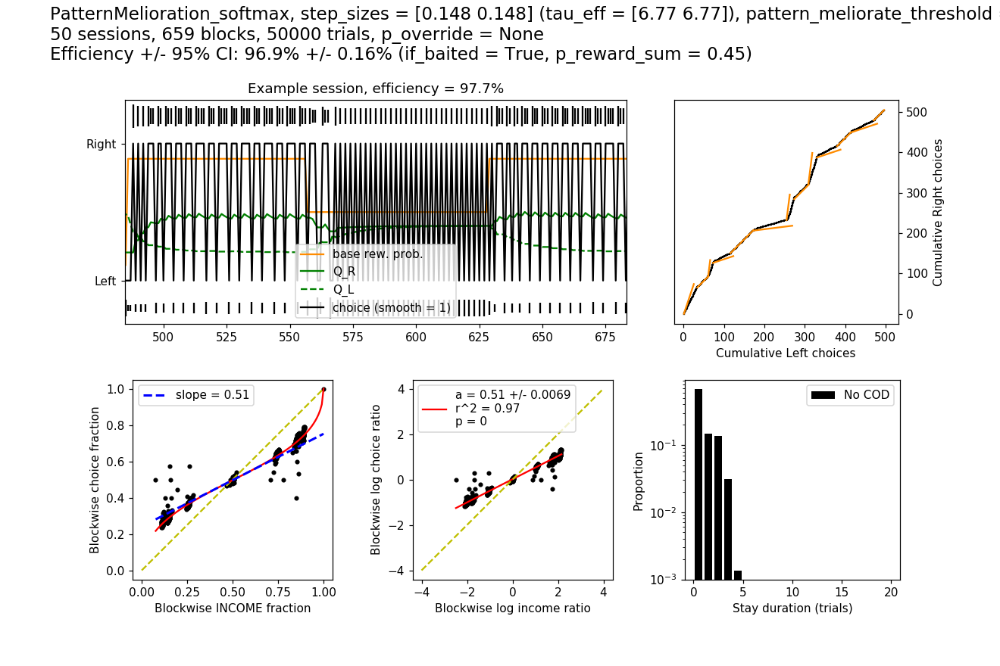

<IPython.core.display.Javascript object>


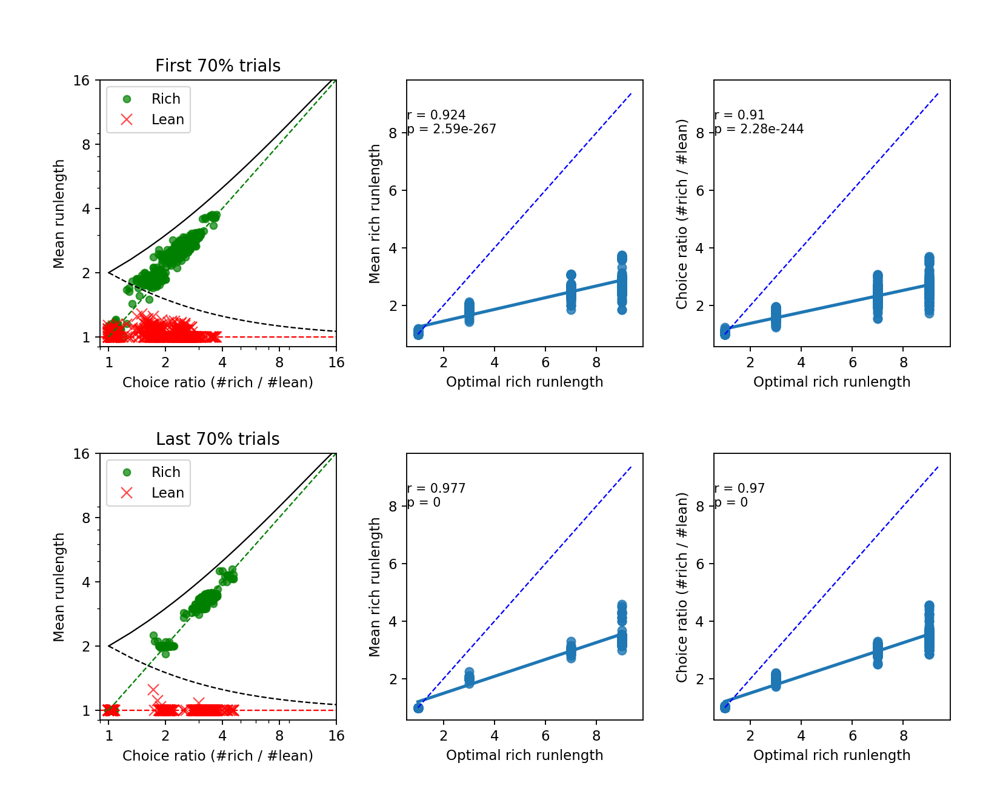

In [5]:
bandit = Bandit(forager = 'PatternMelioration_softmax', step_sizes = 0.1477, pattern_meliorate_softmax_temp = 0.1781, 
                if_varying_amplitude = True, block_size_mean = 80, n_trials = global_n_trials)

results_all_sessions = run_sessions_parallel(bandit, n_reps = 50, pool = pool)  # For debugging, use this.
# # === Runlength analysis ===
choice_history = results_all_sessions['choice_history']
p_reward = results_all_sessions['p_reward']

from utils.plot_mice import analyze_runlength_Lau2005, plot_runlength_Lau2005
run_length_Lau = analyze_runlength_Lau2005(choice_history, p_reward, block_partitions = [70,70])
plot_runlength_Lau2005(run_length_Lau, [70,70]);


### Full state Q-learning


In [ ]:
bandit = Bandit(forager = 'FullStateQ_softmax', block_size_mean = 1000, n_trials = 1000, if_baited = True, p_reward_pairs = [[0.4, 0.05]], 
                step_sizes = 0.1, discount_rate = 0.75, max_run_length = 10, softmax_temperature = 0.1, 
                if_varying_amplitude = True, if_plot_Q = False)
bandit.simulate()
results_all_sessions = run_sessions_parallel(bandit, n_reps = 50, pool = pool)

# # # === Runlength analysis ===
choice_history = results_all_sessions['choice_history']
p_reward = results_all_sessions['p_reward']

from utils.plot_mice import analyze_runlength_Lau2005, plot_runlength_Lau2005
run_length_Lau = analyze_runlength_Lau2005(choice_history, p_reward, block_partitions = [70,70])
plot_runlength_Lau2005(run_length_Lau, [70,70]);

## Optimize FullstateQ (epsilon/softmax, varying prob/amp)

### Varying probability (conventional baiting)

#### FullStateQ_epsilon

differential_evolution step 1: f(x)= -0.897012
differential_evolution step 2: f(x)= -0.897012


apply_async: 100%|██████████| 500/500 [00:05<00:00, 91.69it/s]


<IPython.core.display.Javascript object>


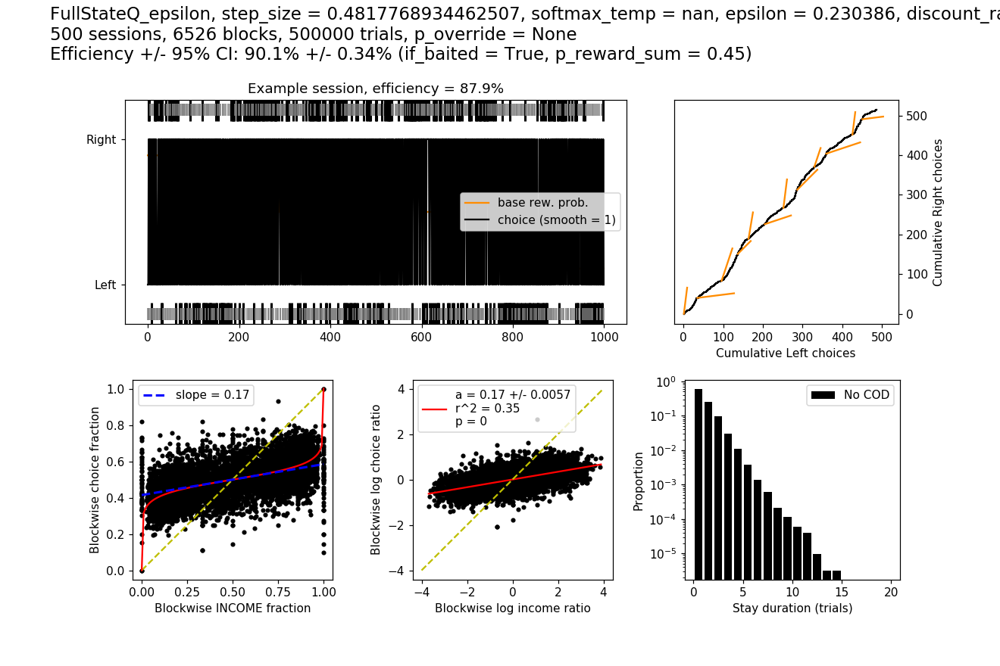

     fun: -0.8970122235731361
 message: 'Optimization terminated successfully.'
    nfev: 375
     nit: 2
 success: True
       x: array([ 0.48177689,  0.23038624,  0.11548774, 17.10885802])
['step_sizes', 'epsilon', 'discount_rate', 'max_run_length']
--- para_optimize finished in 469.61 s ---


In [2]:
opti_para = para_optimize('FullStateQ_epsilon', if_varying_amplitude = False, n_reps_per_iter = 200, pool =  pool)

#### FullStateQ_softmax

differential_evolution step 1: f(x)= -0.916541
differential_evolution step 2: f(x)= -0.916541
differential_evolution step 3: f(x)= -0.916541
differential_evolution step 4: f(x)= -0.921822


apply_async: 100%|██████████| 500/500 [00:08<00:00, 59.67it/s]


<IPython.core.display.Javascript object>


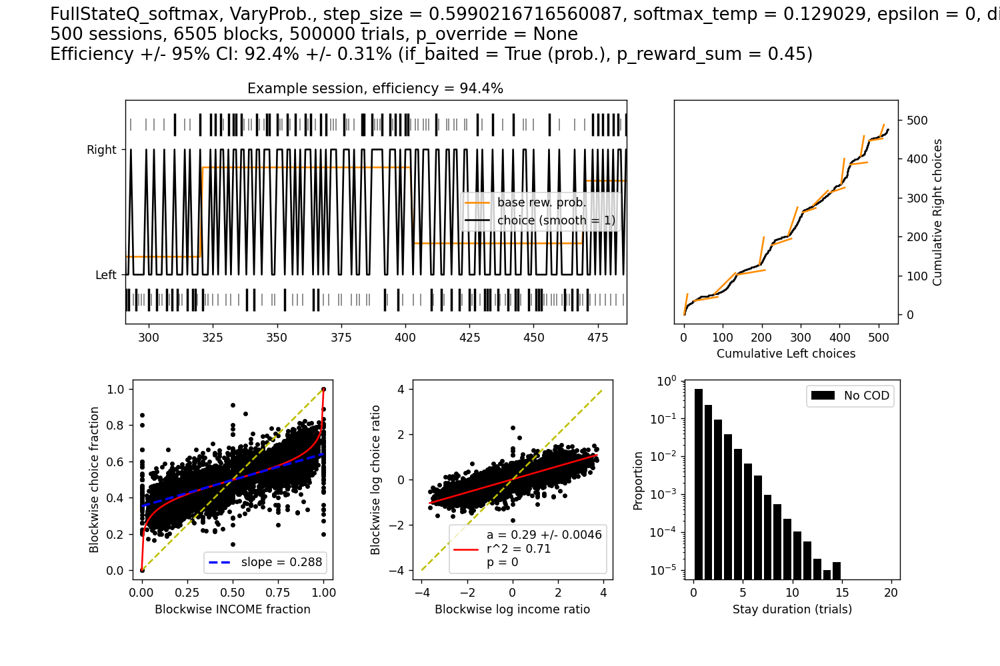

     fun: -0.9218224800196055
 message: 'Optimization terminated successfully.'
    nfev: 468
     nit: 4
 success: True
       x: array([0.59902167, 0.12902947, 0.04694988])
['step_sizes', 'softmax_temperature', 'discount_rate']
--- para_optimize finished in 1169.93 s ---


In [3]:
import scipy.optimize as optimize
opti_para = para_optimize('FullStateQ_softmax', 
                          opti_names = ['step_sizes', 'softmax_temperature', 'discount_rate'],
                          bounds = optimize.Bounds([0.01, 0.01, 0],[1, 1, 1]),
                          if_varying_amplitude = False, n_reps_per_iter = 200, pool =  pool)

apply_async: 100%|██████████| 20/20 [00:01<00:00, 10.52it/s]


<IPython.core.display.Javascript object>


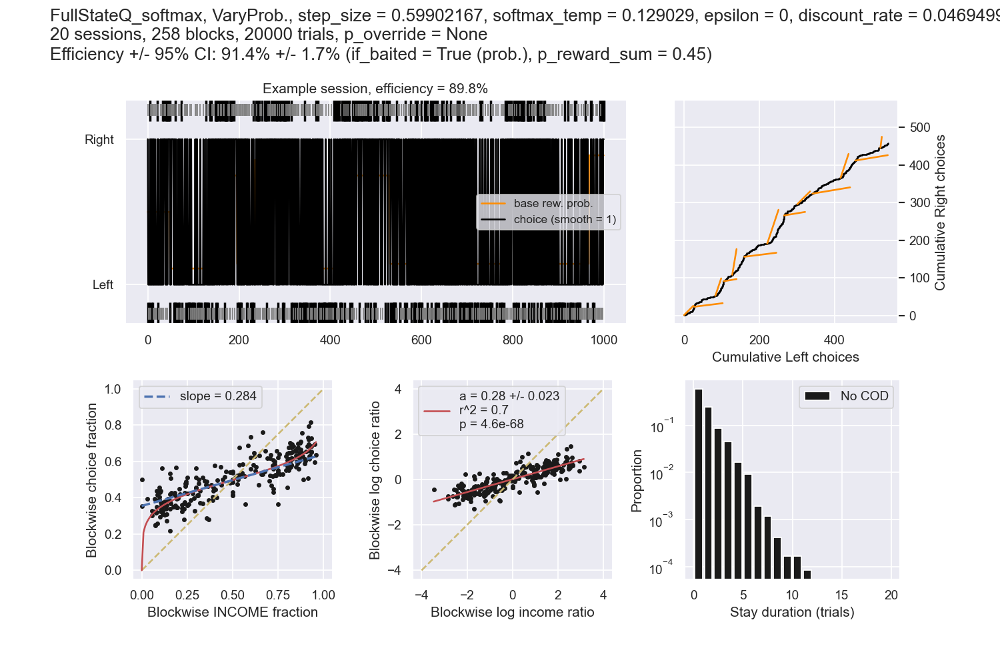

<IPython.core.display.Javascript object>


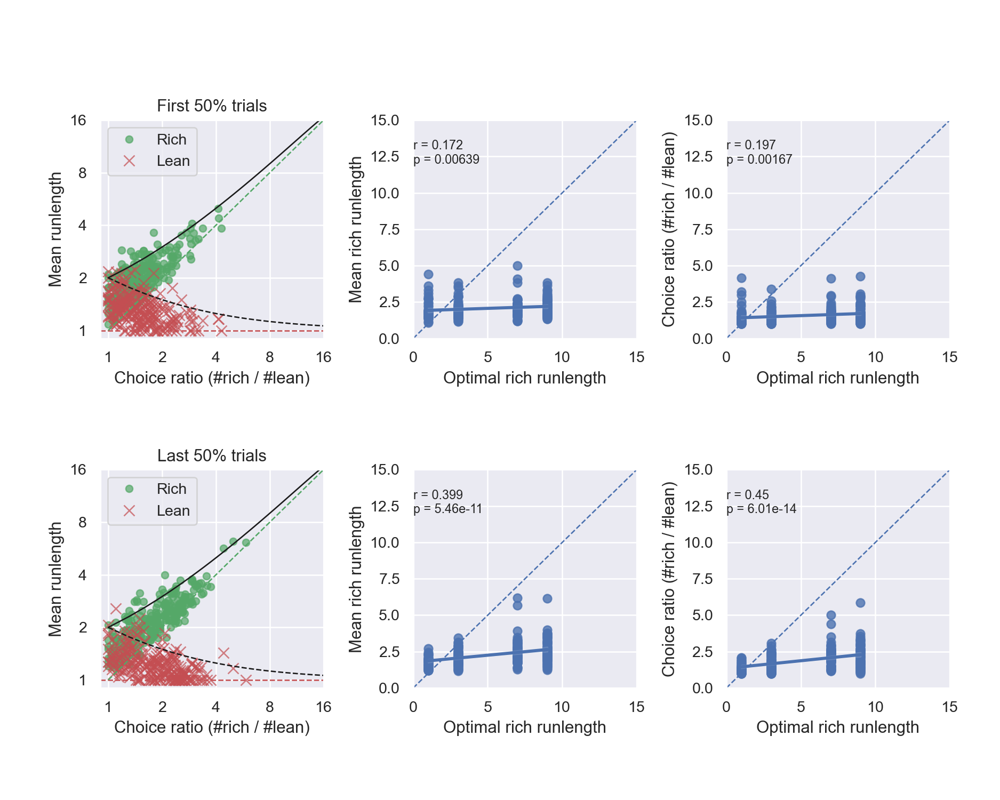

In [6]:
# == Normal blocks, varying prob ==
# ['step_sizes', 'softmax_temperature', 'discount_rate', 'max_run_length']
#  array([ 0.79645452,  0.09857429,  0.05792011, 11.14677311])   ==> 91.7%
bandit = Bandit(forager = 'FullStateQ_softmax', block_size_mean = 80, n_trials = 1000, if_baited = True, 
            step_sizes = 0.59902167, discount_rate = 0.04694988, max_run_length = 15, softmax_temperature = 0.12902947, 
            if_plot_Q = False, if_varying_amplitude = False)

# # results_all_sessions = run_sessions_parallel(bandit, n_reps = 1, pool = '')  # For debugging, use this.

# # # ['step_sizes', 'softmax_temperature', 'discount_rate', 'max_run_length']
# # # [ 0.50085521,  0.08830155,  0.11788019, 12.85673119]

results_all_sessions = run_sessions_parallel(bandit, n_reps = 20, pool = pool)
# results_all_sessions['bandits_all_sessions'][0].full_state_Qforager.plot_Q()

# Runlength analysis 
choice_history = results_all_sessions['choice_history']
p_reward = results_all_sessions['p_reward']

run_length_Lau = analyze_runlength_Lau2005(choice_history, p_reward, block_partitions = [70,70])
plot_runlength_Lau2005(run_length_Lau, [50,50]);


apply_async: 100%|██████████| 500/500 [00:05<00:00, 83.44it/s]


<IPython.core.display.Javascript object>


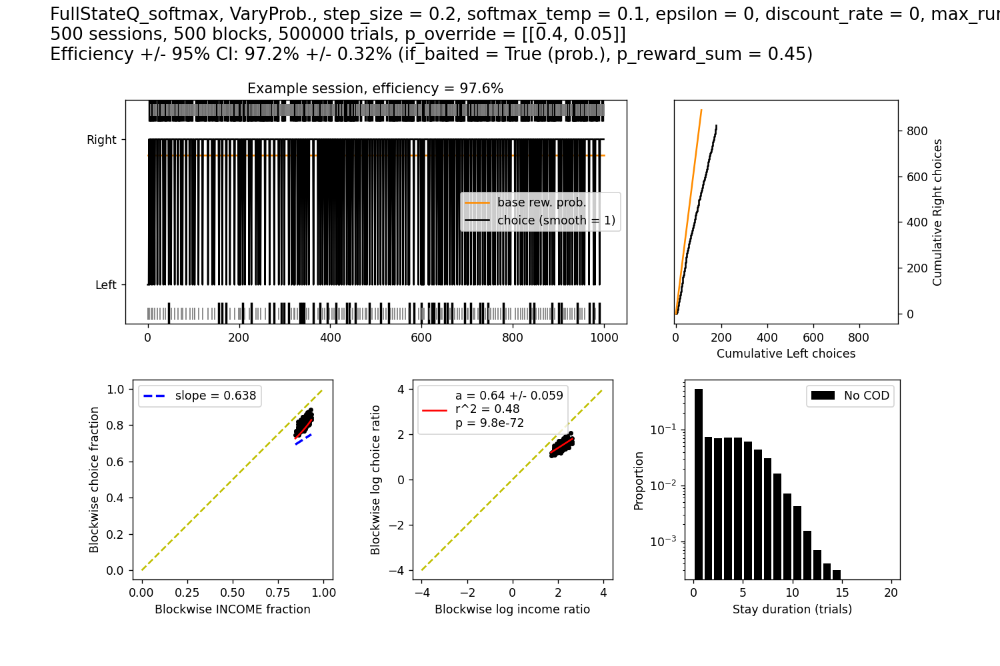

In [3]:
bandit = Bandit(forager = 'FullStateQ_softmax', block_size_mean = 2000, n_trials = 1000, if_baited = True, p_reward_pairs = [[0.4, 0.05]], 
                    step_sizes = 0.2, discount_rate = 0, max_run_length = 15, softmax_temperature = 0.1, 
                    if_plot_Q = False, if_varying_amplitude = False)
results_all_sessions = run_sessions_parallel(bandit, n_reps = 500, pool = pool)

##### About discount rate

apply_async: 100%|██████████| 20000/20000 [05:15<00:00, 63.30it/s]


<IPython.core.display.Javascript object>


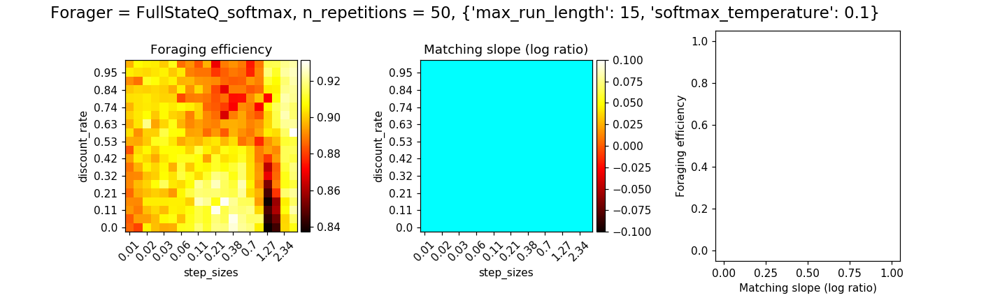

In [8]:
para_to_scan = {'step_sizes': np.power(10, np.linspace(-2,0.5,20)),
                'discount_rate': np.linspace(0,1,20),
                 }
results_para_scan = para_scan('FullStateQ_softmax', para_to_scan, n_reps = 50, 
                               max_run_length = 15, softmax_temperature = 0.1, 
                               pool = pool)

Why the optimal discount rate is so low?<br> **Because the optimal strategy of this configuration is very close to greedy!!!**

apply_async: 100%|██████████| 12000/12000 [03:12<00:00, 62.21it/s]


<IPython.core.display.Javascript object>


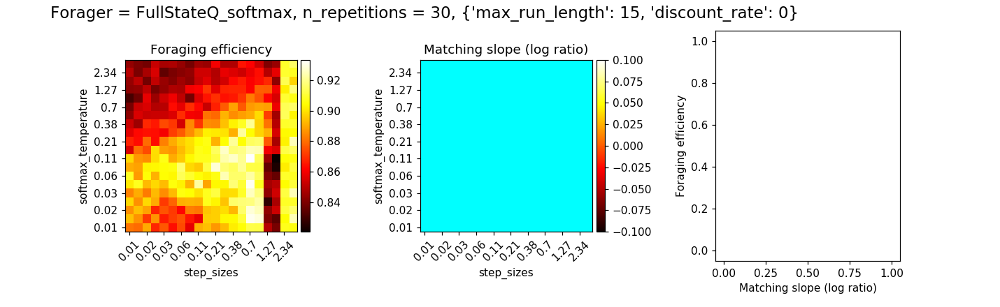

In [6]:
para_to_scan = {'step_sizes': np.power(10, np.linspace(-2,0.5,20)),
                'softmax_temperature': np.power(10, np.linspace(-2,0.5,20)),
                 }
results_para_scan = para_scan('FullStateQ_softmax', para_to_scan, n_reps = 30, 
                               max_run_length = 15, discount_rate = 0,
                               pool = pool)

#### Hattori2019 using varying prob.

apply_async: 100%|██████████| 50/50 [00:00<00:00, 56.75it/s]


<IPython.core.display.Javascript object>


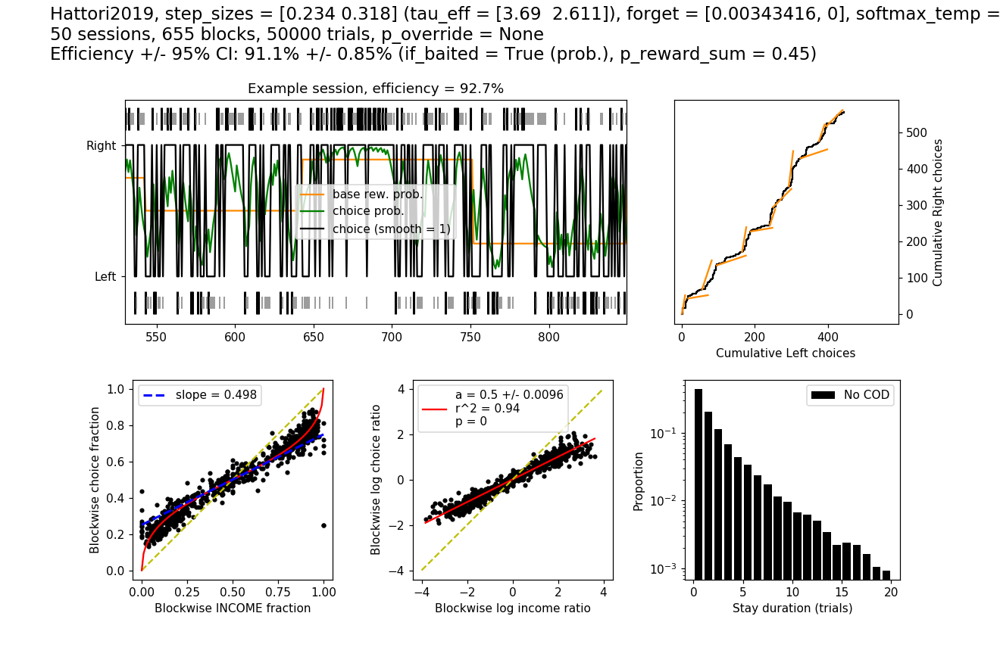

<IPython.core.display.Javascript object>


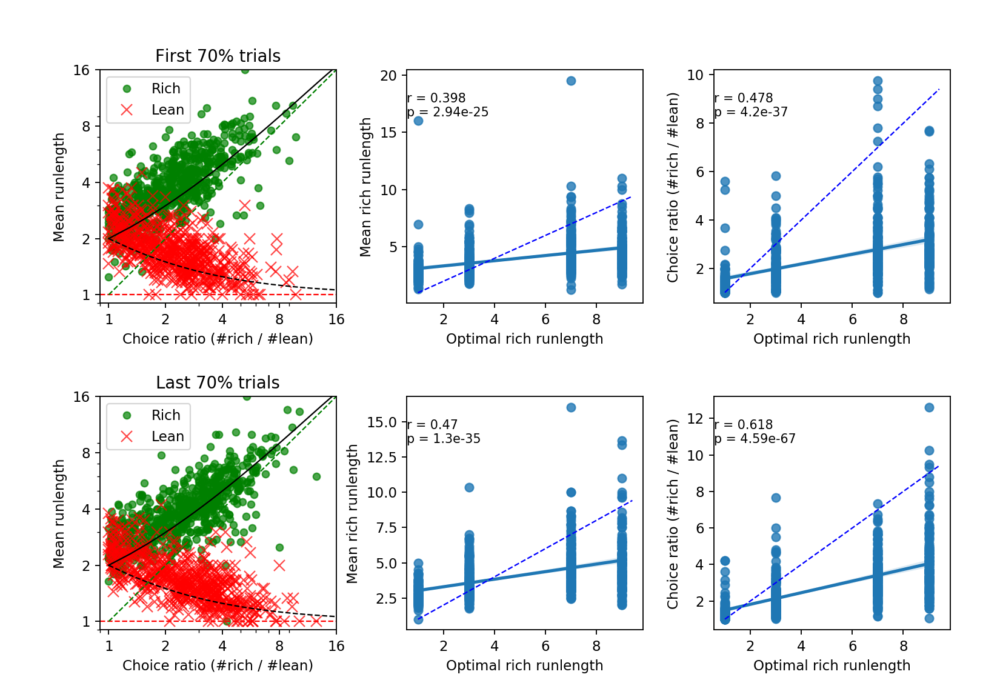

In [9]:
bandit = Bandit(forager = 'Hattori2019', 
                step_sizes = [0.23392543, 0.31816126], forget_rate = 0.00343416, softmax_temperature = 0.22028081, 
                if_varying_amplitude = False, n_trials = global_n_trials)
results_all_sessions = run_sessions_parallel(bandit, n_reps = 50, pool = pool)

# Runlength analysis
choice_history = results_all_sessions['choice_history']
p_reward = results_all_sessions['p_reward']

from utils.plot_mice import analyze_runlength_Lau2005, plot_runlength_Lau2005
run_length_Lau = analyze_runlength_Lau2005(choice_history, p_reward, block_partitions = [70,70])
plot_runlength_Lau2005(run_length_Lau, [70,70]);


### Varying amplitude (no noise up to now)

#### FullStateQ_epsilon

differential_evolution step 1: f(x)= -0.939817
differential_evolution step 2: f(x)= -0.939817
differential_evolution step 3: f(x)= -0.940245
differential_evolution step 4: f(x)= -0.941048


apply_async: 100%|██████████| 500/500 [00:05<00:00, 90.64it/s]


<IPython.core.display.Javascript object>


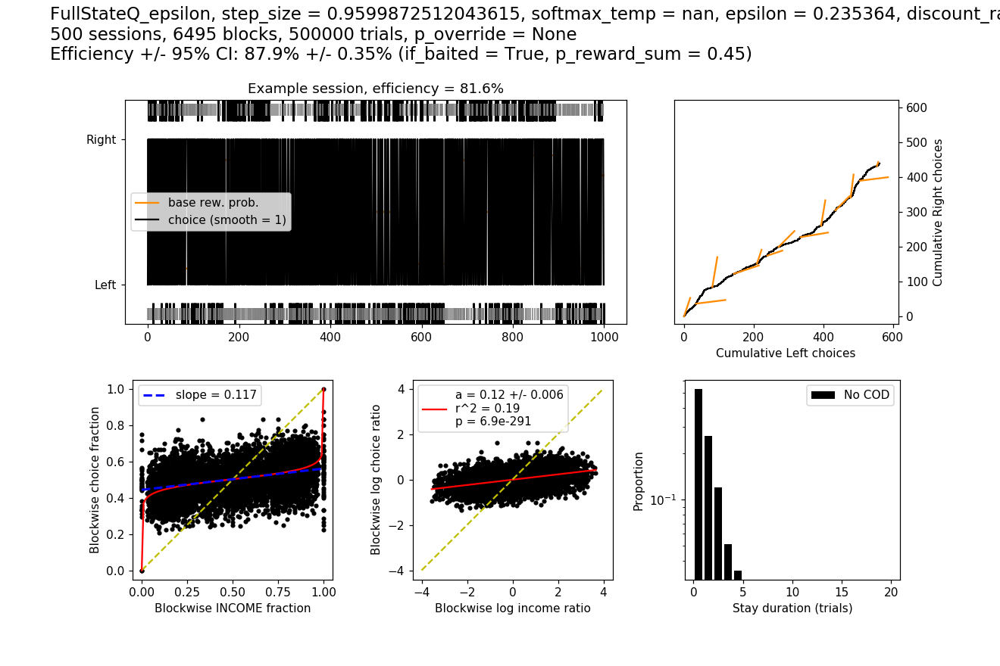

     fun: -0.9410475034461837
 message: 'Optimization terminated successfully.'
    nfev: 525
     nit: 4
 success: True
       x: array([0.95998725, 0.23536354, 0.33502606, 4.73707523])
['step_sizes', 'epsilon', 'discount_rate', 'max_run_length']
--- para_optimize finished in 553.506 s ---


In [3]:
opti_para = para_optimize('FullStateQ_epsilon', if_varying_amplitude = True, n_reps_per_iter = 200, pool =  pool)

#### FullStateQ_softmax

differential_evolution step 1: f(x)= -0.949922
differential_evolution step 2: f(x)= -0.952111
differential_evolution step 3: f(x)= -0.952111
differential_evolution step 4: f(x)= -0.952111
differential_evolution step 5: f(x)= -0.952111
differential_evolution step 6: f(x)= -0.952179
differential_evolution step 7: f(x)= -0.95461


apply_async: 100%|██████████| 500/500 [00:07<00:00, 64.58it/s]


<IPython.core.display.Javascript object>


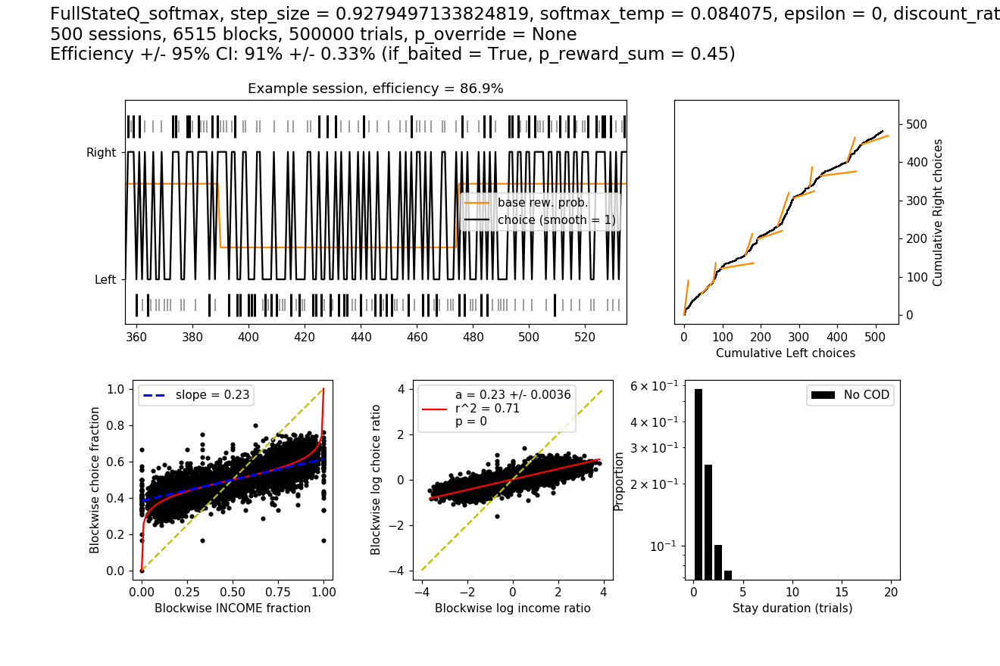

     fun: -0.9546096179478204
 message: 'Optimization terminated successfully.'
    nfev: 745
     nit: 7
 success: True
       x: array([0.92794971, 0.08407503, 0.05293809, 3.92812548])
['step_sizes', 'softmax_temperature', 'discount_rate', 'max_run_length']
--- para_optimize finished in 1431.5 s ---


In [5]:
opti_para = para_optimize('FullStateQ_softmax', if_varying_amplitude = True, n_reps_per_iter = 200, pool =  pool)

apply_async: 100%|██████████| 11250/11250 [03:44<00:00, 50.13it/s]


<IPython.core.display.Javascript object>


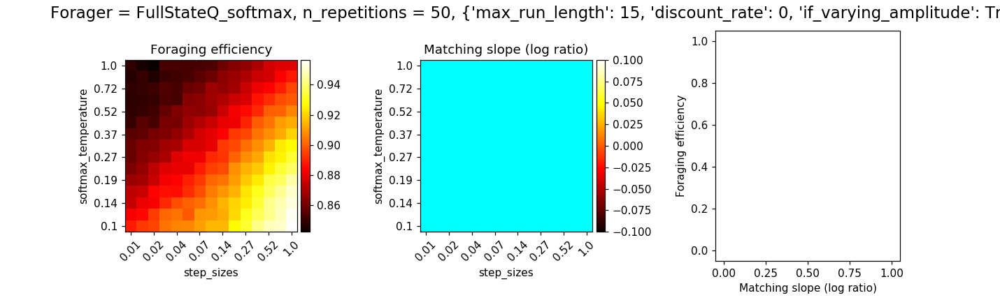

In [9]:
para_to_scan = {'step_sizes': np.power(10, np.linspace(-2,0,15)),
                'softmax_temperature': np.power(10, np.linspace(-1,0,15)),
                 }
results_para_scan = para_scan('FullStateQ_softmax', para_to_scan, n_reps = 50, 
                               max_run_length = 15, discount_rate = 0, if_varying_amplitude = True,
                               pool = pool)

apply_async: 100%|██████████| 50/50 [00:00<00:00, 106.89it/s]


<IPython.core.display.Javascript object>


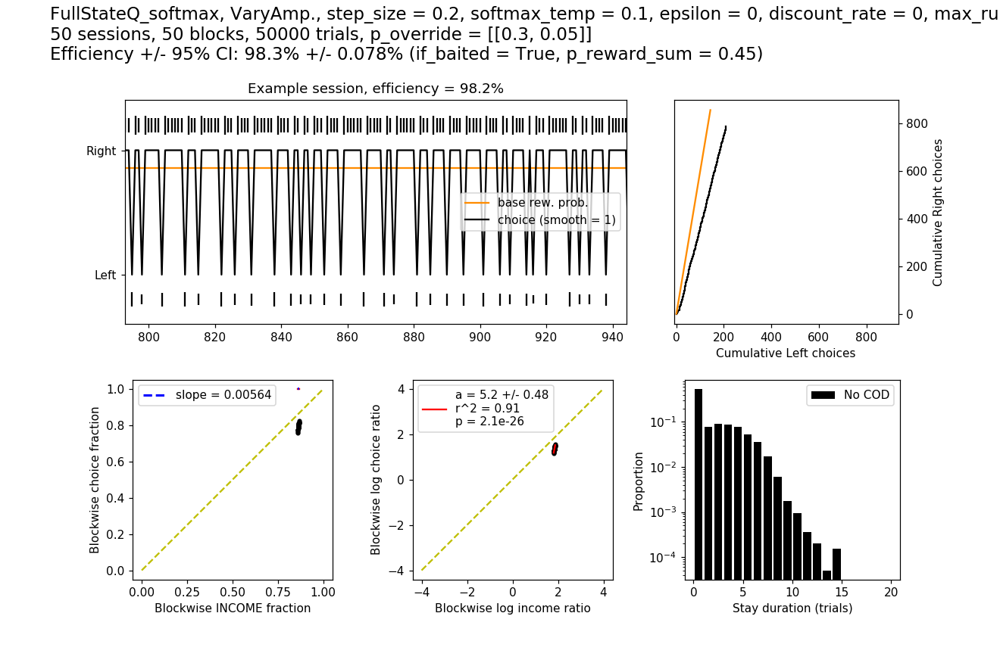

<IPython.core.display.Javascript object>


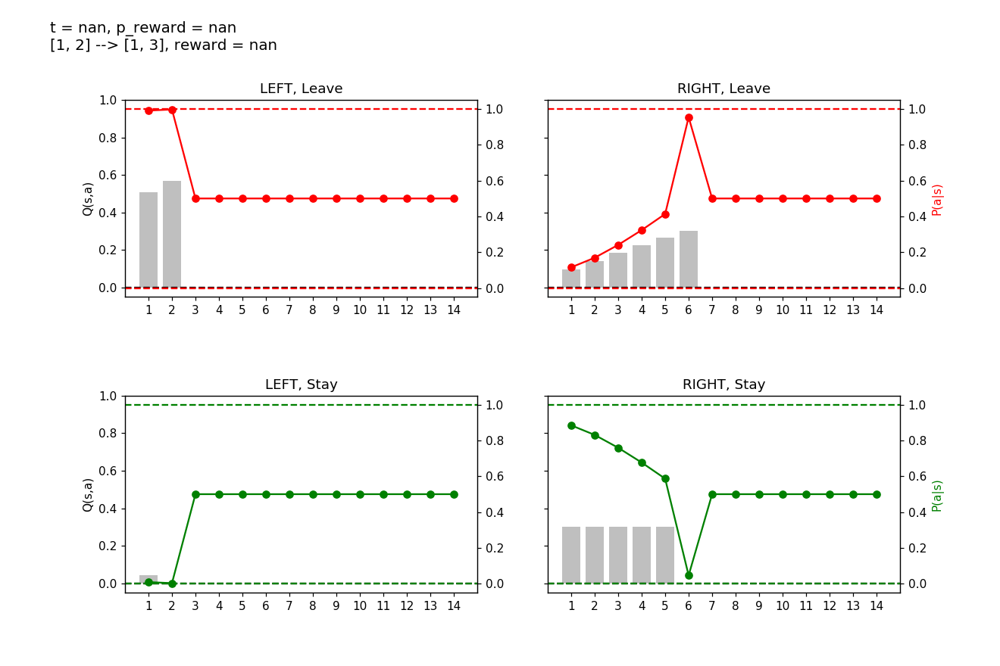

nan


In [11]:
bandit = Bandit(forager = 'FullStateQ_softmax', block_size_mean = 2000, n_trials = 1000, if_baited = True, p_reward_pairs = [[0.3, 0.05]], 
            step_sizes = 0.2, discount_rate = 0, max_run_length = 15, softmax_temperature = 0.1, 
            if_plot_Q = False, if_varying_amplitude = True)

results_all_sessions = run_sessions_parallel(bandit, n_reps = 50, pool = pool)
results_all_sessions['bandits_all_sessions'][0].full_state_Qforager.plot_Q()

apply_async: 100%|██████████| 50/50 [00:00<00:00, 72.23it/s]


<IPython.core.display.Javascript object>


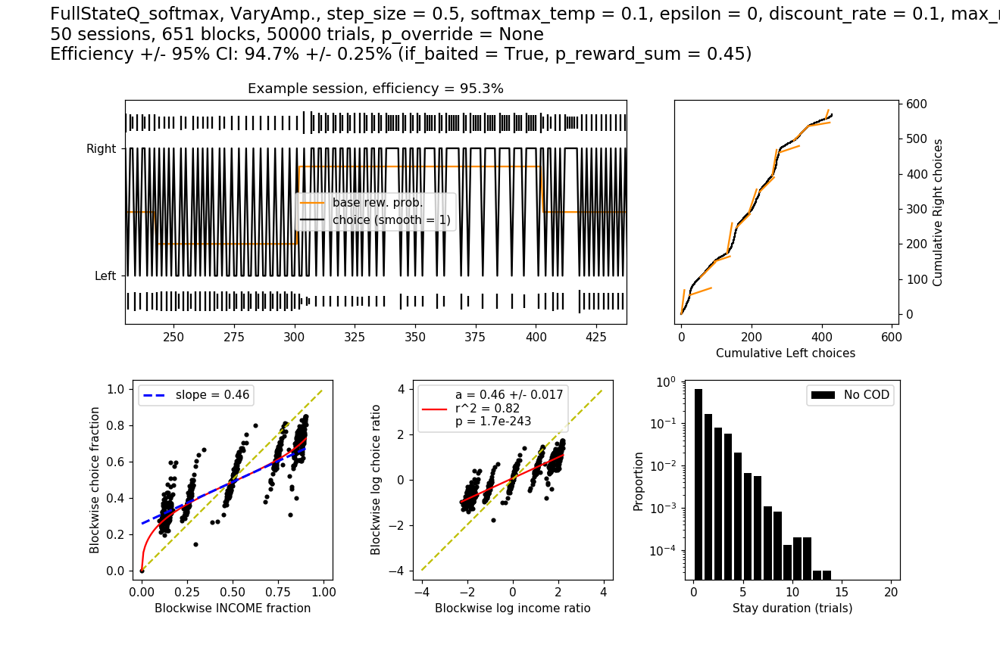

<IPython.core.display.Javascript object>


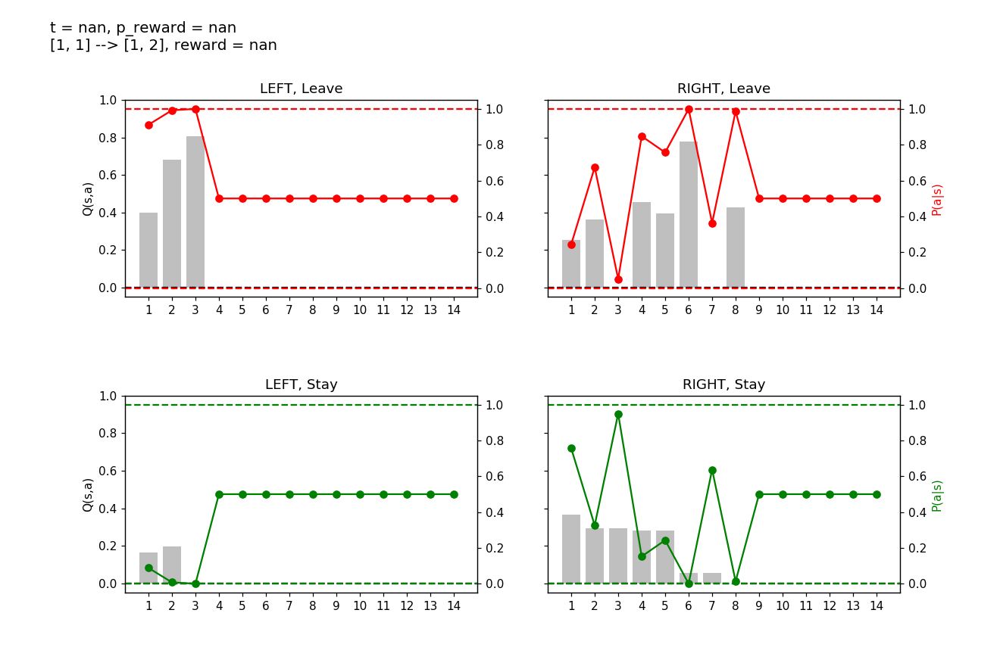

nan


<IPython.core.display.Javascript object>


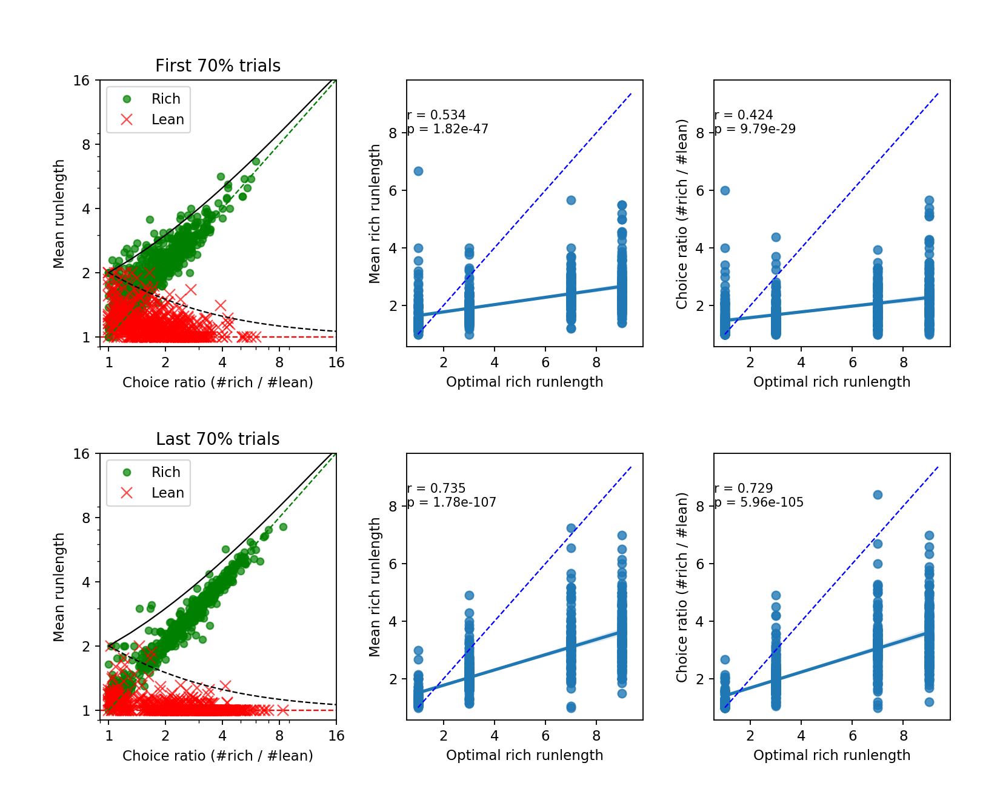

In [12]:
bandit = Bandit(forager = 'FullStateQ_softmax', block_size_mean = 80, n_trials = 1000, if_baited = True, 
            step_sizes = 0.5, discount_rate = 0.1, max_run_length = 15, softmax_temperature = 0.1, 
            if_plot_Q = False, if_varying_amplitude = True)

# # results_all_sessions = run_sessions_parallel(bandit, n_reps = 1, pool = '')  # For debugging, use this.
# # # ['step_sizes', 'softmax_temperature', 'discount_rate', 'max_run_length']
# # # [ 0.50085521,  0.08830155,  0.11788019, 12.85673119]

results_all_sessions = run_sessions_parallel(bandit, n_reps = 50, pool = pool)
results_all_sessions['bandits_all_sessions'][0].full_state_Qforager.plot_Q()

# # # # # # === Runlength analysis ===
choice_history = results_all_sessions['choice_history']
p_reward = results_all_sessions['p_reward']

from utils.plot_mice import analyze_runlength_Lau2005, plot_runlength_Lau2005
run_length_Lau = analyze_runlength_Lau2005(choice_history, p_reward, block_partitions = [70,70])
plot_runlength_Lau2005(run_length_Lau, [70,70]);


#### Hattori2019 using varying amplitude

In [ ]:
opti_para = para_optimize('Hattori2019', n_reps_per_iter = 200, pool = pool, if_varying_amplitude = True)

**Under varying amplitude, Hattori2019 also becomes better (more like {m,1}), but still slightly worse than FullQ.**

apply_async: 100%|██████████| 50/50 [00:02<00:00, 23.30it/s]


<IPython.core.display.Javascript object>


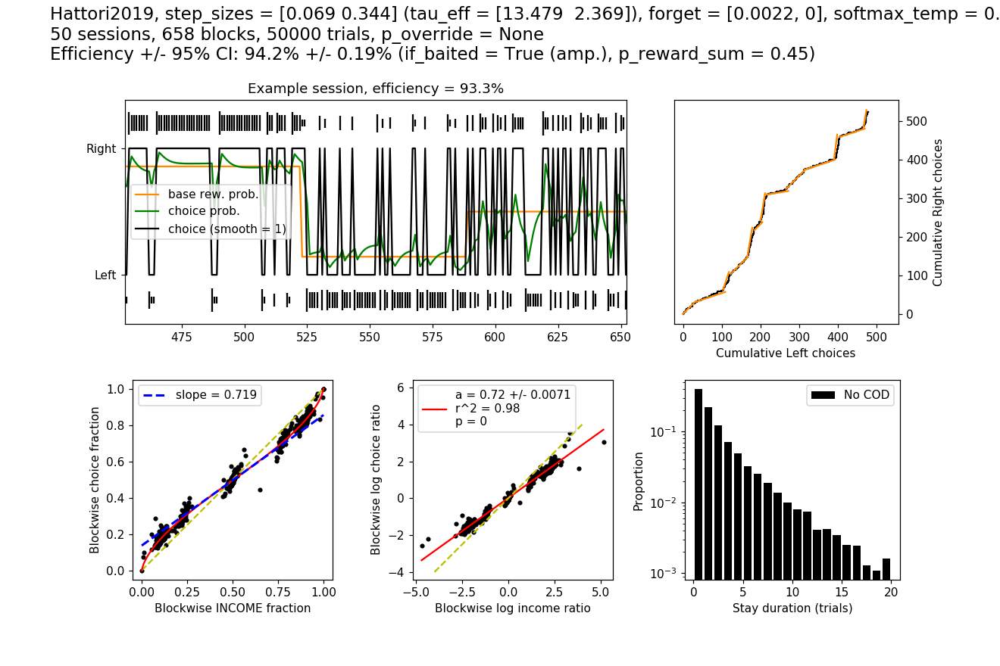

<IPython.core.display.Javascript object>


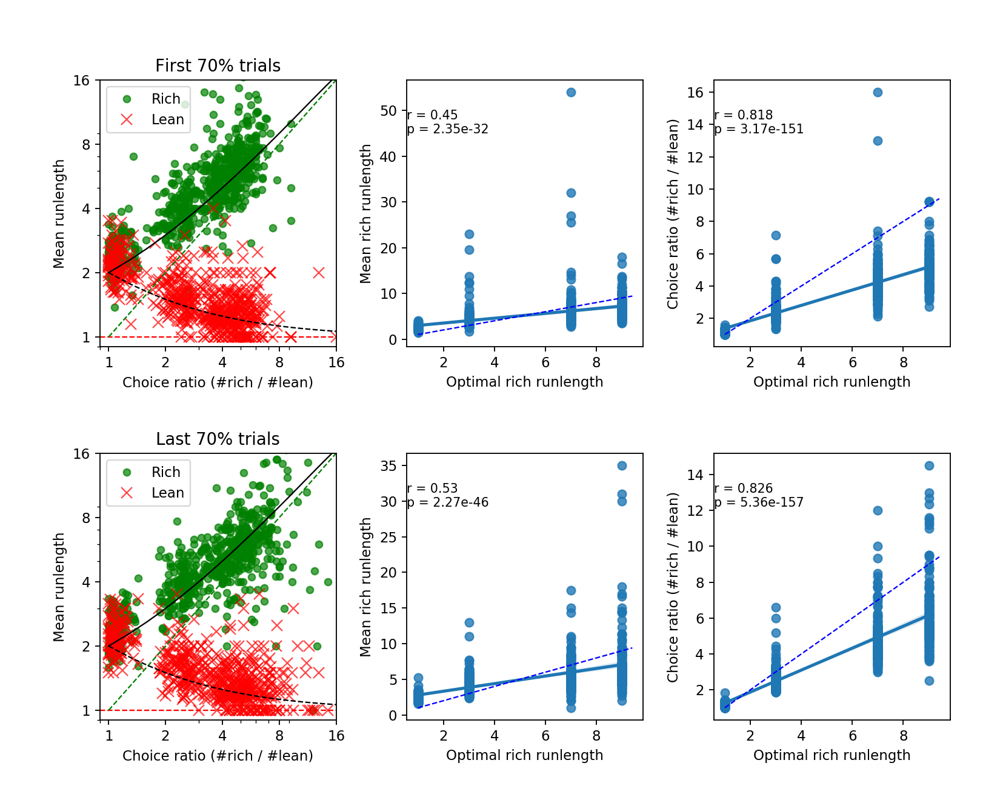

In [2]:
bandit = Bandit(forager = 'Hattori2019', 
                step_sizes = [0.06930557, 0.34428925], forget_rate = 0.0022, softmax_temperature = 0.11330533, 
                if_varying_amplitude = True, n_trials = global_n_trials)
results_all_sessions = run_sessions_parallel(bandit, n_reps = 50, pool = pool)

# Runlength analysis
choice_history = results_all_sessions['choice_history']
p_reward = results_all_sessions['p_reward']

from utils.plot_mice import analyze_runlength_Lau2005, plot_runlength_Lau2005
run_length_Lau = analyze_runlength_Lau2005(choice_history, p_reward, block_partitions = [70,70])
plot_runlength_Lau2005(run_length_Lau, [70,70]);
